In [11]:
# CS180 (CS280A): Project 1 starter Python code

# these are just some suggested libraries
# instead of scikit-image you could use matplotlib and opencv to read, write, and display images

import numpy as np
import skimage.io as skio
import matplotlib.pyplot as plt
from scipy.ndimage import shift
from skimage.transform import rescale
from scipy.ndimage import shift as scipy_shift
import os
from skimage import io, img_as_float
from skimage.transform import rescale
from skimage.metrics import structural_similarity as ssim
import os

In [6]:
#HELPER FUNCTIONS:
def crop_10_percent(img):
    h, w = img.shape[:2]
    crop_h, crop_w = h // 10, w // 10
    return img[crop_h:-crop_h, crop_w:-crop_w]

# Function to calculate NCC between two images
def normalized_cross_correlation(image1, image2):
    image1_mean = np.mean(image1)
    image2_mean = np.mean(image2)
    
    numerator = np.sum((image1 - image1_mean) * (image2 - image2_mean))
    denominator = np.sqrt(np.sum((image1 - image1_mean) ** 2) * np.sum((image2 - image2_mean) ** 2))
    
    epsilon = 0.000001
    return numerator / (denominator + epsilon)

# Function to calculate Euclidean distance between two images
def euclidean_distance(img1, img2):
    return np.linalg.norm(img1.astype(float) - img2.astype(float))
    
def normalize_image(image):
    if np.issubdtype(image.dtype, np.integer):
        max_val = np.max(image)
        if max_val > 255:
            image = (image / max_val) * 255
        return image.astype(np.uint8)
    elif np.issubdtype(image.dtype, np.float):
        max_val = np.max(image)
        if max_val > 1.0:
            image = image / max_val
        return image
    return image

def shift_image(image, dy, dx):
    return np.roll(np.roll(image, dy, axis=0), dx, axis=1)

def downsample_image(image, factor=2):
    return rescale(image, 1.0 / factor, anti_aliasing=True)

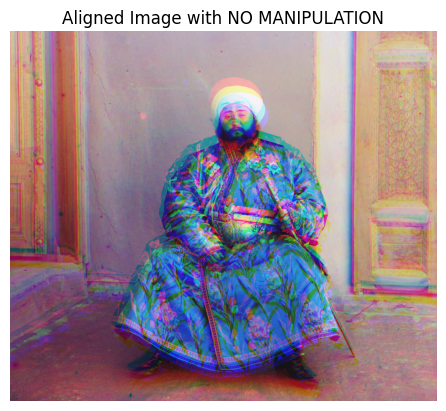

In [7]:
#NO IMAGE MANIPULATION
# name of the input file
imname = 'data/emir.tif'

# read in the image
im = skio.imread(imname)
    
# # compute the height of each part (just 1/3 of total)
height = np.floor(im.shape[0] / 3.0).astype(int)

# # separate color channels
#order of images is in BGR (Blue, Green, Red)
b = im[:height]
g = im[height: 2*height]
r = im[2*height: 3*height]

# Apply cropping to all channels
b = crop_10_percent(b)
g = crop_10_percent(g)
r = crop_10_percent(r)

composite_image = np.dstack([r, g, b])
composite_image = normalize_image(composite_image)

# Display the composite image
plt.imshow(composite_image)
plt.axis('off')  # Hide axis
plt.title('Aligned Image with NO MANIPULATION')
plt.show()

Green Displacement Vector: (-6, 0)
Red Displacement Vector: (9, 1)


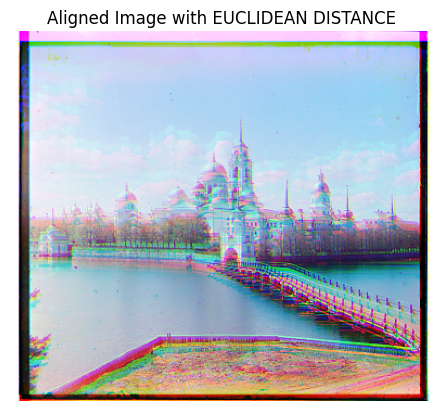

In [8]:
#SINGLE SCALE IMPLEMENTATION FOR EUCLIDEAN DISTANCE
# Function to align the image parts using exhaustive search with EUCLIDEAN DISTANCE
def align_images(b, g, r, max_displacement=15):
    best_displacement_g = (0, 0)
    best_displacement_r = (0, 0)
    min_distance_g = float('inf')
    min_distance_r = float('inf')
    
    # Exhaustive search for Green channel alignment
    for dy in range(-max_displacement, max_displacement + 1):
        for dx in range(-max_displacement, max_displacement + 1):
            shifted_g = shift_image(g, dy, dx)
            distance_g = euclidean_distance(b, shifted_g)
            
            if distance_g < min_distance_g:
                min_distance_g = distance_g
                best_displacement_g = (dy, dx)
    
    # Exhaustive search for Red channel alignment
    for dy in range(-max_displacement, max_displacement + 1):
        for dx in range(-max_displacement, max_displacement + 1):
            shifted_r = shift_image(r, dy, dx)
            distance_r = euclidean_distance(b, shifted_r)
            
            if distance_r < min_distance_r:
                min_distance_r = distance_r
                best_displacement_r = (dy, dx)
    
    # Print displacement vectors
    print(f"Green Displacement Vector: {best_displacement_g}")
    print(f"Red Displacement Vector: {best_displacement_r}")
    
    # Apply the best displacements to G and R channels
    aligned_g = shift_image(g, best_displacement_g[0], best_displacement_g[1])
    aligned_r = shift_image(r, best_displacement_r[0], best_displacement_r[1])
    
    # Stack the aligned channels into an RGB image
    aligned_image = np.dstack([aligned_r, aligned_g, b])
    
    return aligned_image

# Load the image
imname = 'data/monastery.jpg'
im = skio.imread(imname)

# Compute the height of each part (assuming the image is a vertically stacked B, G, R)
total_height = im.shape[0]
height = total_height // 3

# Separate the color channels (in BGR order)
b = im[:height]
g = im[height:2*height]
r = im[2*height:3*height]

# Align the images
aligned_image = normalize_image(align_images(b, g, r))

# Display the composite image
plt.imshow(aligned_image)
plt.axis('off')  # Hide axis
plt.title('Aligned Image with EUCLIDEAN DISTANCE')
plt.show()

In [9]:
#PYRAMID IMPLEMENTATION WITH NCC

Displacement for G: [49, 24]
Displacement for R: [98, -206]


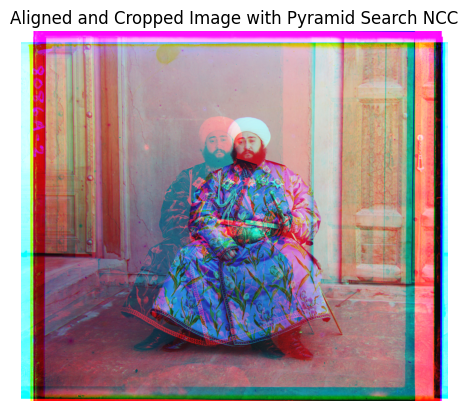

Displacement for G: [-3, 2]
Displacement for R: [3, 2]


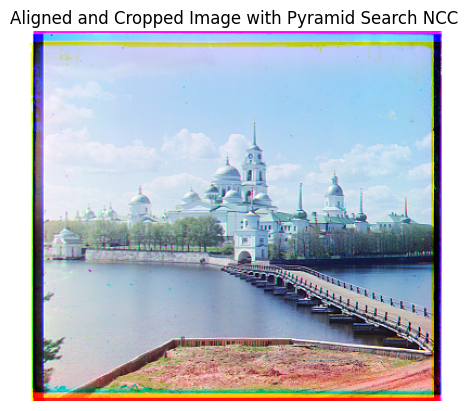

Displacement for G: [25, 4]
Displacement for R: [58, -4]


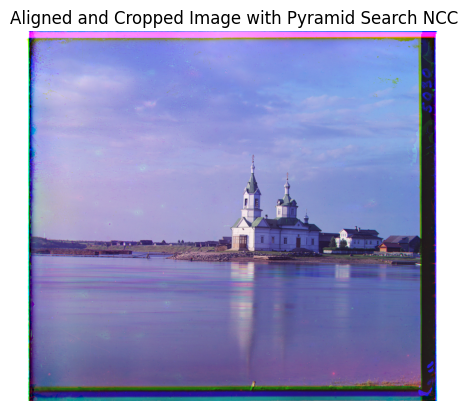

Displacement for G: [53, 14]
Displacement for R: [112, 11]


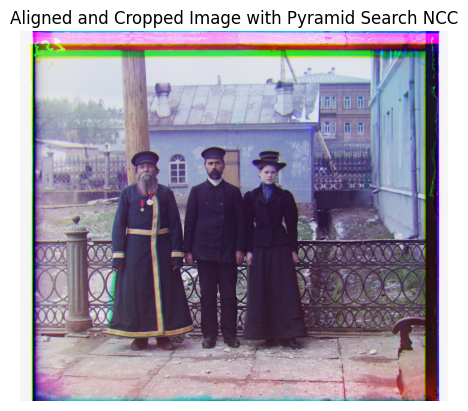

Displacement for G: [81, 10]
Displacement for R: [178, 13]


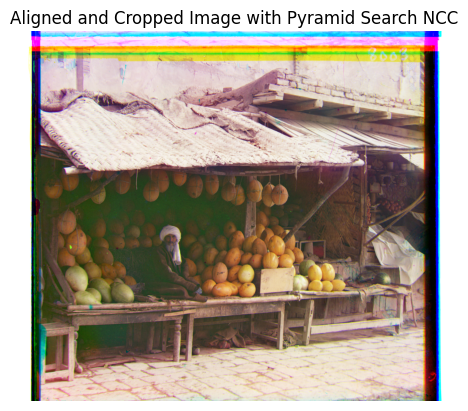

Displacement for G: [51, 26]
Displacement for R: [108, 36]


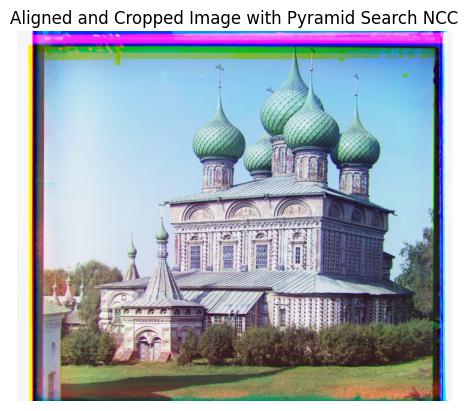

Displacement for G: [42, 5]
Displacement for R: [87, 32]


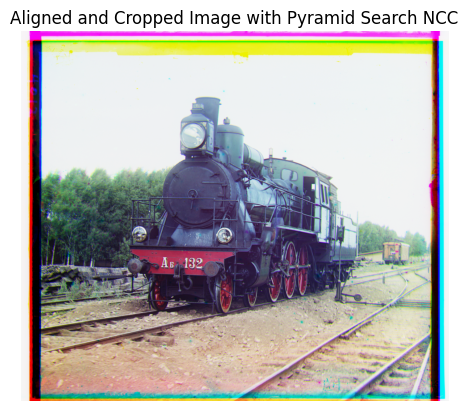

Displacement for G: [3, 3]
Displacement for R: [6, 3]


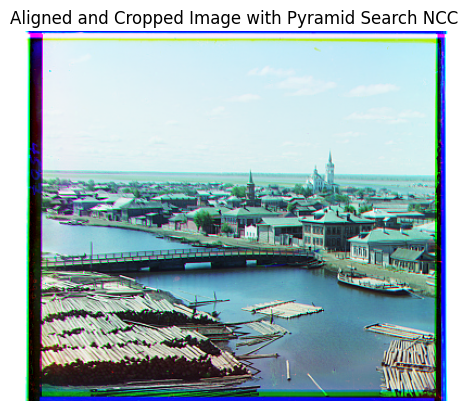

Displacement for G: [41, 17]
Displacement for R: [89, 23]


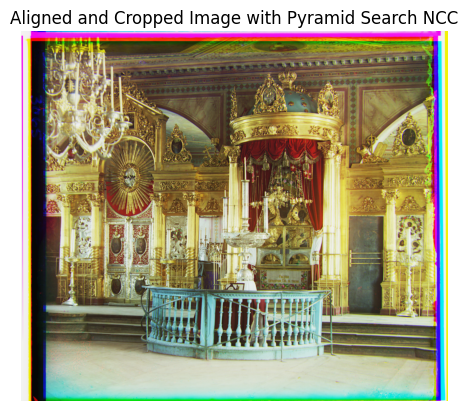

Displacement for G: [3, 2]
Displacement for R: [11, 3]


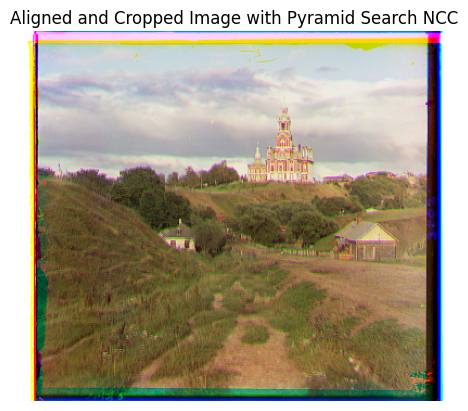

Displacement for G: [78, 29]
Displacement for R: [176, 37]


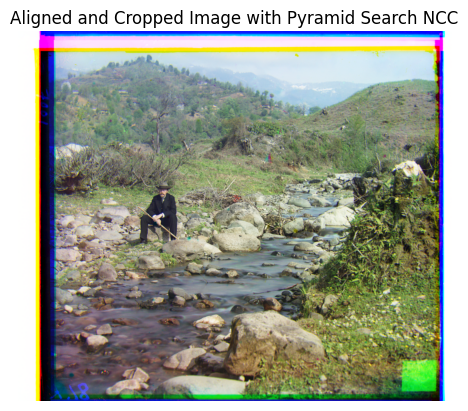

Displacement for G: [59, 16]
Displacement for R: [124, 13]


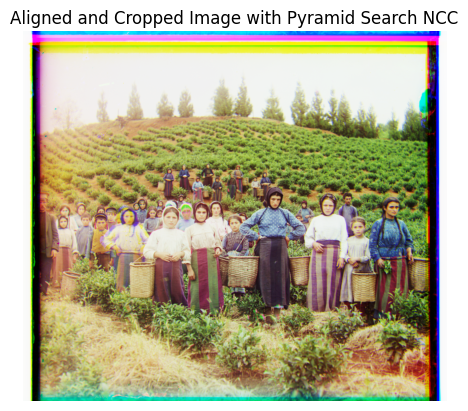

Displacement for G: [33, -11]
Displacement for R: [140, -27]


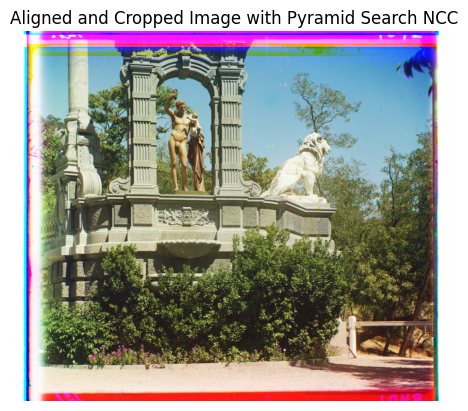

Displacement for G: [51, 9]
Displacement for R: [111, 12]


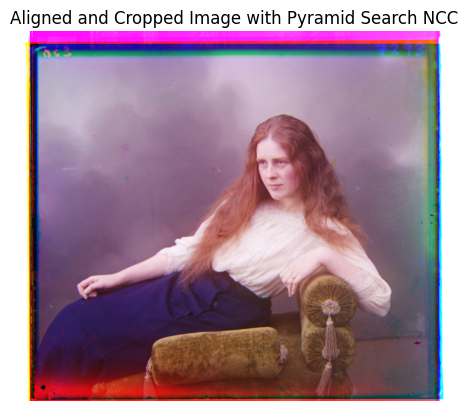

['Project1CS180.ipynb', 'harvesters_generated_ncc.png', 'cs180proj1', 'lady_generated_ssim.png', 'onion_church_generated_ssim.png', '.DS_Store', 'three_generations_generated_ssim.png', 'icon_generated_ssim.png', 'onion_church_generated_ncc.png', 'melons_generated_ssim.png', 'cathedral_generated_ncc.png', 'icon_generated_ncc.png', 'tobolsk_generated_ncc.png', 'emir_generated_ssim.png', 'melons_generated_ncc.png', 'three_generations_generated_ncc.png', 'cathedral_generated_ssim.png', 'church_generated_ncc.png', 'harvesters_generated_ssim.png', 'train_generated_ncc.png', 'tobolsk_generated_ssim.png', 'train_generated_ssim.png', 'self_portrait_generated_ssim.png', 'church_generated_ssim.png', '.ipynb_checkpoints', 'emir_generated_ncc.png', 'data', 'monastery_generated_ncc.png', 'sculpture_generated_ssim.png', 'self_portrait_generated_ncc.png', 'sculpture_generated_ncc.png', 'monastery_generated_ssim.png', 'lady_generated_ncc.png']


In [13]:
def crop_10_percent(im):
    h, w = im.shape
    h_crop = int(0.1 * h)
    w_crop = int(0.1 * w)
    return im[h_crop:-h_crop, w_crop:-w_crop]

def normalized_cross_correlation(im1, im2):
    im1_mean = np.mean(im1)
    im2_mean = np.mean(im2)
    numerator = np.sum((im1 - im1_mean) * (im2 - im2_mean))
    denominator = np.sqrt(np.sum((im1 - im1_mean)**2) * np.sum((im2 - im2_mean)**2))
    if denominator == 0:
        return 0
    else:
        return numerator / denominator

def align_images(im1, im2):
    # Build the image pyramid
    h, w = im1.shape
    min_dim = min(h, w)
    max_levels = int(np.floor(np.log2(min_dim / 32)))
    max_levels = max(0, max_levels)
    
    im1_pyramid = [im1]
    im2_pyramid = [im2]
    
    for _ in range(max_levels):
        im1 = rescale(im1, 0.5, anti_aliasing=True)
        im2 = rescale(im2, 0.5, anti_aliasing=True)
        im1_pyramid.append(im1)
        im2_pyramid.append(im2)
    
    displacement = [0, 0]
    for level in reversed(range(len(im1_pyramid))):
        im1_level = im1_pyramid[level]
        im2_level = im2_pyramid[level]
        
        # Scale displacement
        displacement = [d * 2 for d in displacement]
        
        # Define the search window
        if level == len(im1_pyramid) - 1:
            max_offset = int(0.05 * min(im1_level.shape))
            search_range_y = range(-max_offset, max_offset + 1)
            search_range_x = range(-max_offset, max_offset + 1)
        else:
            search_range_y = range(-2, 2)
            search_range_x = range(-2, 2)
        
        best_ncc = -np.inf
        best_disp = displacement.copy()
        
        # Crop images
        crop = int(0.1 * min(im1_level.shape))
        im1_crop = im1_level[crop:-crop, crop:-crop]
        im2_crop = im2_level[crop:-crop, crop:-crop]
        
        for dy in search_range_y:
            for dx in search_range_x:
                total_dy = displacement[0] + dy
                total_dx = displacement[1] + dx
                shifted_im1 = np.roll(np.roll(im1_crop, total_dy, axis=0), total_dx, axis=1)
                ncc = normalized_cross_correlation(shifted_im1, im2_crop)
                if ncc > best_ncc:
                    best_ncc = ncc
                    best_disp = [total_dy, total_dx]
        displacement = best_disp.copy()
    return displacement

# Load image
files = os.listdir("./data")
for file in files:
    if "tif" in file or "jpg" in file:
        imname = f"data/{file}"
        im = img_as_float(io.imread(imname))
        
        # Split the image into three channels
        height = int(np.floor(im.shape[0] / 3.0))
        b = im[:height, :]
        g = im[height:2*height, :]
        r = im[2*height:3*height, :]
        
        # Align G and R channels to B channel
        disp_g = align_images(g, b)
        disp_r = align_images(r, b)
        
        print("Displacement for G:", disp_g)
        print("Displacement for R:", disp_r)
        
        def shift_image(image, dy, dx):
            return np.roll(np.roll(image, dy, axis=0), dx, axis=1)
            
        aligned_g = shift_image(g, disp_g[0], disp_g[1])
        aligned_r = shift_image(r, disp_r[0], disp_r[1])
        
        # Stack the channels to form a color image
        color_image = np.dstack([aligned_r, aligned_g, b])
        
        # Plot and save the cropped image
        plt.imshow(color_image)
        plt.title('Aligned and Cropped Image with Pyramid Search NCC')
        plt.axis('off')
        name = file.split(".")[0]
        plt.savefig(f"{name}_generated_ncc", bbox_inches='tight')
        plt.show()

print(os.listdir())

In [14]:
#SSIM IMPLEMENTATION WITH PYRAMID

Displacement for G: [50, 23]
Displacement for R: [105, 40]


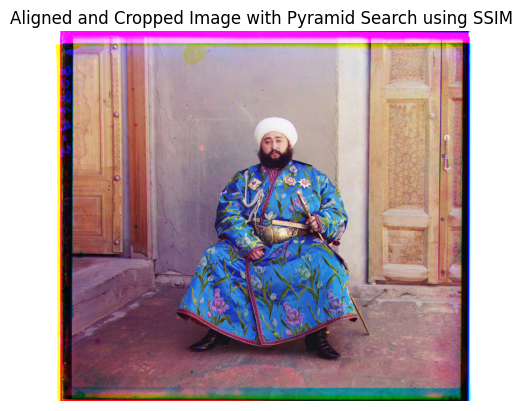

Displacement for G: [-3, 2]
Displacement for R: [3, 2]


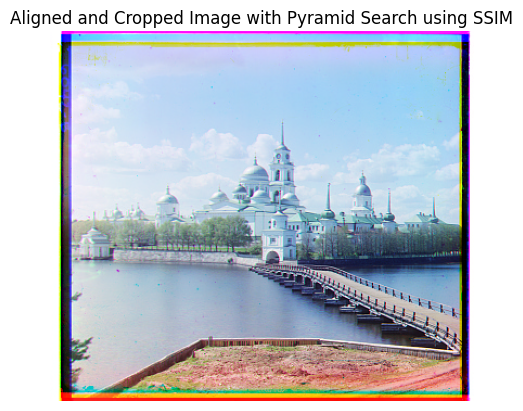

Displacement for G: [25, 4]
Displacement for R: [58, -4]


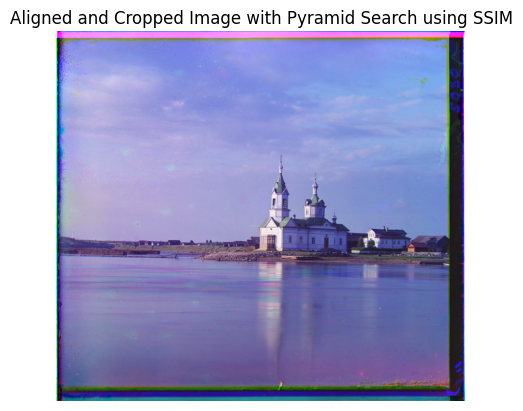

Displacement for G: [55, 17]
Displacement for R: [113, 11]


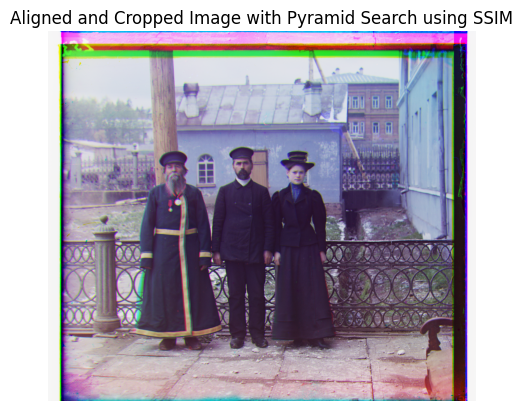

Displacement for G: [80, 10]
Displacement for R: [177, 13]


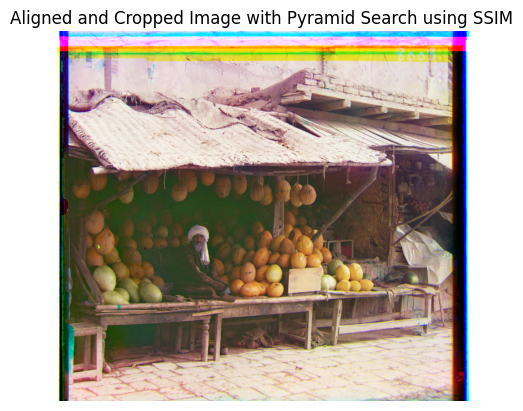

Displacement for G: [51, 27]
Displacement for R: [108, 35]


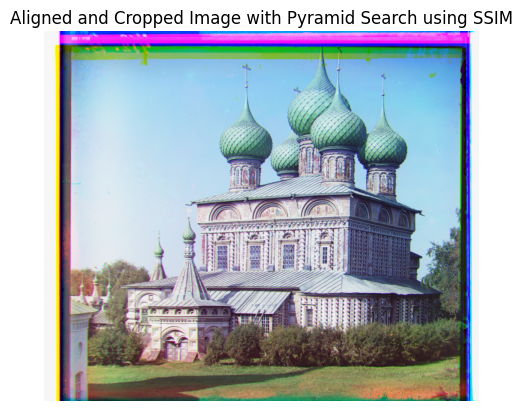

Displacement for G: [40, 7]
Displacement for R: [85, 30]


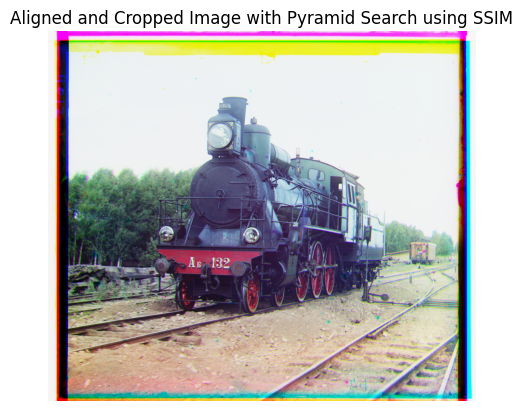

Displacement for G: [3, 3]
Displacement for R: [6, 3]


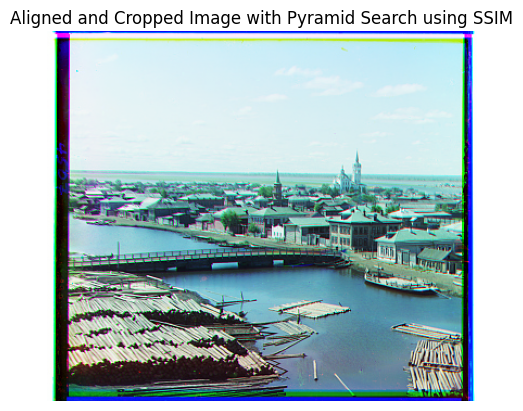

Displacement for G: [40, 17]
Displacement for R: [89, 23]


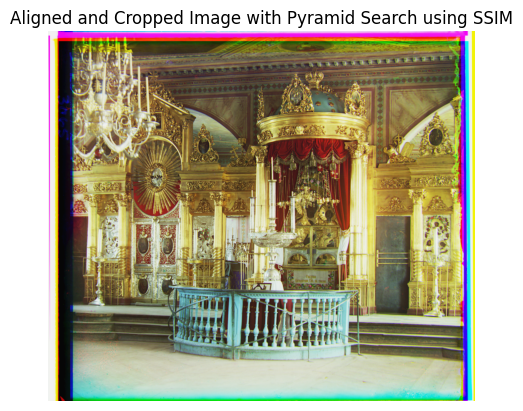

Displacement for G: [5, 2]
Displacement for R: [12, 3]


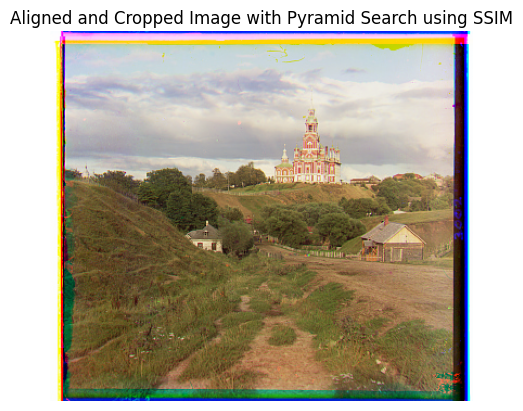

Displacement for G: [78, 29]
Displacement for R: [175, 37]


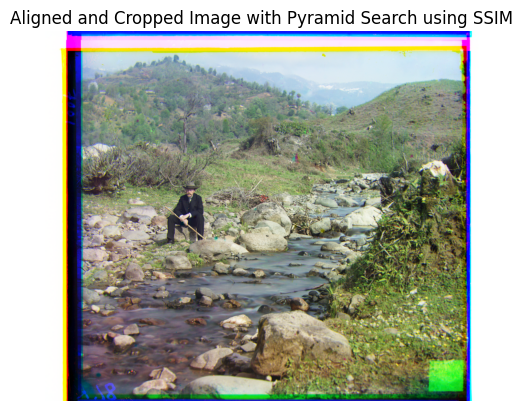

Displacement for G: [59, 16]
Displacement for R: [123, 13]


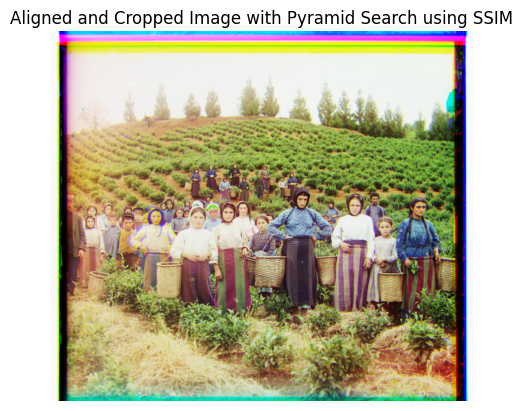

Displacement for G: [33, -11]
Displacement for R: [140, -27]


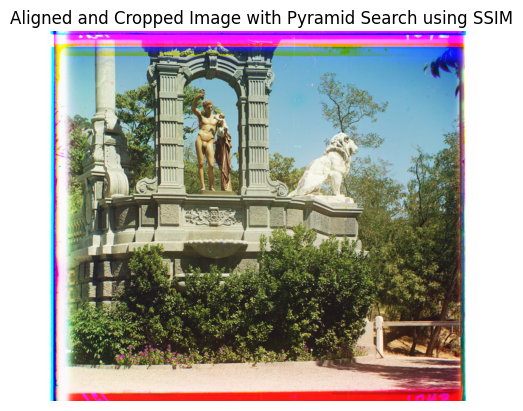

Displacement for G: [56, 9]
Displacement for R: [119, 12]


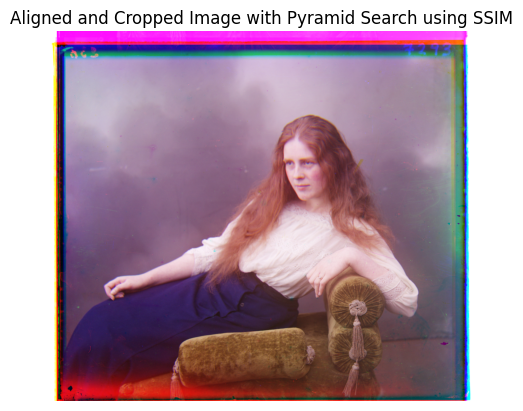

['Project1CS180.ipynb', 'harvesters_generated_ncc.png', 'cs180proj1', 'lady_generated_ssim.png', 'onion_church_generated_ssim.png', '.DS_Store', 'three_generations_generated_ssim.png', 'icon_generated_ssim.png', 'onion_church_generated_ncc.png', 'melons_generated_ssim.png', 'cathedral_generated_ncc.png', 'icon_generated_ncc.png', 'tobolsk_generated_ncc.png', 'emir_generated_ssim.png', 'melons_generated_ncc.png', 'three_generations_generated_ncc.png', 'cathedral_generated_ssim.png', 'church_generated_ncc.png', 'harvesters_generated_ssim.png', 'train_generated_ncc.png', 'tobolsk_generated_ssim.png', 'train_generated_ssim.png', 'self_portrait_generated_ssim.png', 'church_generated_ssim.png', '.ipynb_checkpoints', 'emir_generated_ncc.png', 'data', 'monastery_generated_ncc.png', 'sculpture_generated_ssim.png', 'self_portrait_generated_ncc.png', 'sculpture_generated_ncc.png', 'monastery_generated_ssim.png', 'lady_generated_ncc.png']


In [15]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, img_as_float
from skimage.transform import rescale
from skimage.metrics import structural_similarity as ssim
import os

# Function to crop 10% of the image borders
def crop_10_percent(im):
    h, w = im.shape
    h_crop = int(0.1 * h)
    w_crop = int(0.1 * w)
    return im[h_crop:-h_crop, w_crop:-w_crop]

# Function to align images using SSIM instead of NCC
def align_images_ssim(im1, im2):
    # Build the image pyramid
    h, w = im1.shape
    min_dim = min(h, w)
    max_levels = int(np.floor(np.log2(min_dim / 32)))
    max_levels = max(0, max_levels)
    
    im1_pyramid = [im1]
    im2_pyramid = [im2]
    
    for _ in range(max_levels):
        im1 = rescale(im1, 0.5, anti_aliasing=True)
        im2 = rescale(im2, 0.5, anti_aliasing=True)
        im1_pyramid.append(im1)
        im2_pyramid.append(im2)
    
    displacement = [0, 0]
    for level in reversed(range(len(im1_pyramid))):
        im1_level = im1_pyramid[level]
        im2_level = im2_pyramid[level]
        
        # Scale displacement
        displacement = [d * 2 for d in displacement]
        
        # Define the search window
        if level == len(im1_pyramid) - 1:
            max_offset = int(0.05 * min(im1_level.shape))
            search_range_y = range(-max_offset, max_offset + 1)
            search_range_x = range(-max_offset, max_offset + 1)
        else:
            search_range_y = range(-2, 2)
            search_range_x = range(-2, 2)
        
        best_ssim = -np.inf
        best_disp = displacement.copy()
        
        # Crop images
        crop = int(0.1 * min(im1_level.shape))
        im1_crop = im1_level[crop:-crop, crop:-crop]
        im2_crop = im2_level[crop:-crop, crop:-crop]
        
        for dy in search_range_y:
            for dx in search_range_x:
                total_dy = displacement[0] + dy
                total_dx = displacement[1] + dx
                shifted_im1 = np.roll(np.roll(im1_crop, total_dy, axis=0), total_dx, axis=1)
                
                # Compute SSIM and specify data_range as 1.0 for normalized images
                score, _ = ssim(shifted_im1, im2_crop, data_range=1.0, full=True)
                
                if score > best_ssim:
                    best_ssim = score
                    best_disp = [total_dy, total_dx]
        
        displacement = best_disp.copy()
    
    return displacement

# Function to shift the image by dy and dx
def shift_image(image, dy, dx):
    return np.roll(np.roll(image, dy, axis=0), dx, axis=1)

# Load images from the directory
files = os.listdir("./data")
for file in files:
    if "tif" in file or "jpg" in file:
        imname = f"data/{file}"
        im = img_as_float(io.imread(imname))
        
        # Split the image into three channels
        height = int(np.floor(im.shape[0] / 3.0))
        b = im[:height, :]
        g = im[height:2*height, :]
        r = im[2*height:3*height, :]
        
        # Align G and R channels to B channel using SSIM
        disp_g = align_images_ssim(g, b)
        disp_r = align_images_ssim(r, b)
        
        print("Displacement for G:", disp_g)
        print("Displacement for R:", disp_r)
        
        # Shift the images based on the calculated displacements
        aligned_g = shift_image(g, disp_g[0], disp_g[1])
        aligned_r = shift_image(r, disp_r[0], disp_r[1])
        
        # Stack the channels to form a color image
        color_image = np.dstack([aligned_r, aligned_g, b])
        
        # Plot and save the aligned and cropped image
        plt.imshow(color_image)
        plt.title('Aligned and Cropped Image with Pyramid Search using SSIM')
        plt.axis('off')
        name = file.split(".")[0]
        plt.savefig(f"{name}_generated_ssim", bbox_inches='tight')
        plt.show()

# Check directory listing
print(os.listdir())
